In [1]:
import xlb
import math
import time
import glob
import numpy as np
import jax
import jax.numpy as jnp
import imageio
from PIL import Image

from xlb.compute_backend import ComputeBackend
from xlb.precision_policy import PrecisionPolicy
from xlb.grid import grid_factory
from xlb.operator.stepper import IncompressibleNavierStokesStepper
from xlb.operator.boundary_condition import ExtrapolationOutflowBC, HalfwayBounceBackBC
from xlb.operator.equilibrium import QuadraticEquilibrium
from xlb.operator.macroscopic import Macroscopic
from xlb.utils import save_image

try:
    from xlb.utils import save_fields_vtk
    _HAS_VTK = True
except Exception:
    _HAS_VTK = False


# ------------------------------ Geometry helpers ------------------------------

#def build_single_slit_barrier_indices(Nx, Ny, barrier_x, slit_width, slit_center_y=None):

#    if slit_center_y is None:
#        slit_center_y = Ny // 2

#    wall = np.zeros((Nx, Ny), dtype=np.uint8)
#    wall[barrier_x, :] = 1

#    s_y0 = max(1, slit_center_y - slit_width // 2)
#    s_y1 = min(Ny - 2, slit_center_y + slit_width // 2)
#    wall[barrier_x, s_y0:s_y1 + 1] = 0

#    xs, ys = np.where(wall == 1)
#    return [xs.astype(np.int32).tolist(), ys.astype(np.int32).tolist()]

def build_double_slit_barrier_indices(Nx, Ny, barrier_x, slit_width, slit_gap, slit_center_y=None):
    """
    Returns indices [xs, ys] for a vertical barrier at x=barrier_x, with TWO slits carved out.
    Indices are (x,y) with x in [0..Nx-1], y in [0..Ny-1].
    """
    if slit_center_y is None:
        slit_center_y = Ny // 2

    wall = np.zeros((Nx, Ny), dtype=np.uint8)
    wall[barrier_x, :] = 1

    c1 = slit_center_y - slit_gap // 2
    c2 = slit_center_y + slit_gap // 2

    s1_y0 = max(1, c1 - slit_width // 2)
    s1_y1 = min(Ny - 2, c1 + slit_width // 2)
    s2_y0 = max(1, c2 - slit_width // 2)
    s2_y1 = min(Ny - 2, c2 + slit_width // 2)

    wall[barrier_x, s1_y0:s1_y1 + 1] = 0
    wall[barrier_x, s2_y0:s2_y1 + 1] = 0

    xs, ys = np.where(wall == 1)
    return [xs.astype(np.int32).tolist(), ys.astype(np.int32).tolist()]


def indices_to_set_2d(indices):
    xs = np.asarray(indices[0], dtype=np.int32)
    ys = np.asarray(indices[1], dtype=np.int32)
    return set(zip(xs.tolist(), ys.tolist()))


def set_to_indices_2d(s):
    if not s:
        return [[], []]
    xs, ys = zip(*sorted(s))
    return [list(xs), list(ys)]


# ------------------------------ IO helpers ------------------------------

def make_gif(pattern="2D_young_wave_*.png", output="2D_young_double_slit.gif", fps=20):
    files = sorted(glob.glob(pattern))
    if not files:
        raise RuntimeError(f"No PNG files found for pattern: {pattern}")
    frames = [Image.open(f).convert("RGB") for f in files]
    imageio.mimsave(output, frames, duration=1.0 / fps)
    print(f"GIF saved as {output}")


def to_01_fixed_scale(field2d, scale):
    """
    Stable visualization: map [-scale, +scale] -> [0,1] with clipping.
    This avoids the 'all-black' problem of percentile normalization when the signal is tiny/flat.
    """
    a = np.asarray(field2d, dtype=np.float32)
    a = np.clip(a, -scale, +scale)
    return (a / scale + 1.0) * 0.5


# ------------------------------ Source injection ------------------------------

@jax.jit
def inject_source_equilibrium(f, xs, ys, feq):
    """
    Overwrite f[:, xs, ys] = feq_q (broadcasted over source nodes)

    f shape:   (q, Nx, Ny)
    xs, ys:    (Ns,)
    feq shape: (q, 1, 1) or (q, 1) depending on implementation.
    """
    feq_q = jnp.reshape(feq, (feq.shape[0], -1))[:, 0]  # -> (q,)
    return f.at[:, xs, ys].set(feq_q[:, None])          # broadcast over Ns


def main():
    # -------------------- Domain (2D) --------------------
    Nx, Ny = 520, 280

    # Barrier / slits geometry (internal wall)
    barrier_x = Nx // 3
    slit_width = 18
    slit_gap = 60

    # -------------------- Source (internal POINT source, no inlet) --------------------
    rho0 = 1.0
    rho_amp = 0.02
    freq = 0.02  # cycles per timestep
    phase_per_step = 2.0 * math.pi * freq

    # Place point source inside the domain (away from boundaries and away from barrier)
    source_x = Nx // 6
    source_y = Ny // 2
    xs_src = np.array([source_x], dtype=np.int32)
    ys_src = np.array([source_y], dtype=np.int32)

    # -------------------- LBM parameters (mostly for stability) --------------------
    Re = 200.0
    L = float(Ny)
    u_char = 0.02
    nu = (u_char * L) / Re
    omega = 1.0 / (3.0 * nu + 0.5)

    # -------------------- Simulation control --------------------
    steps = 2500
    save_every = 10
    prefix = "2D_young_wave"

    # -------------------- Backend & velocity set (JAX) --------------------
    compute_backend = ComputeBackend.JAX
    precision_policy = PrecisionPolicy.FP32FP32

    velocity_set = xlb.velocity_set.D2Q9(
        precision_policy=precision_policy,
        compute_backend=compute_backend,
    )

    xlb.init(
        velocity_set=velocity_set,
        default_backend=compute_backend,
        default_precision_policy=precision_policy,
    )

    grid = grid_factory((Nx, Ny), compute_backend=compute_backend)

    # -------------------- Boundary indices --------------------
    box_no_edge = grid.bounding_box_indices(remove_edges=True)
    left = box_no_edge["left"]
    right = box_no_edge["right"]
    top = box_no_edge["top"]
    bottom = box_no_edge["bottom"]

    barrier = build_double_slit_barrier_indices(Nx, Ny, barrier_x, slit_width, slit_gap)
#    barrier = build_single_slit_barrier_indices(Nx, Ny, barrier_x, slit_width, slit_center_y=None)
    # Remove any accidental overlaps between barrier and outer boundaries
    S_left = indices_to_set_2d(left)
    S_right = indices_to_set_2d(right)
    S_top = indices_to_set_2d(top)
    S_bottom = indices_to_set_2d(bottom)
    S_bar = indices_to_set_2d(barrier)

    S_bar = S_bar - S_left - S_right - S_top - S_bottom
    S_left = S_left - S_bar
    S_right = S_right - S_bar
    S_top = S_top - S_bar
    S_bottom = S_bottom - S_bar

    left = set_to_indices_2d(S_left)
    right = set_to_indices_2d(S_right)
    top = set_to_indices_2d(S_top)
    bottom = set_to_indices_2d(S_bottom)
    barrier = set_to_indices_2d(S_bar)

    # -------------------- Sanity check: source must not lie on BC or barrier --------------------
    S_all_bc = S_left | S_right | S_top | S_bottom | S_bar
    src_pt = (int(source_x), int(source_y))
    if src_pt in S_all_bc:
        raise RuntimeError(
            f"Source point {src_pt} lies on a boundary or barrier cell. "
            "Move source_x/source_y away from boundaries and barrier."
        )

    # -------------------- Boundary conditions (ALL outer boundaries same type) --------------------
    bc_left = ExtrapolationOutflowBC(indices=left)
    bc_right = ExtrapolationOutflowBC(indices=right)
    bc_top = ExtrapolationOutflowBC(indices=top)
    bc_bottom = ExtrapolationOutflowBC(indices=bottom)

    # Internal solid barrier
    bc_barrier = HalfwayBounceBackBC(indices=barrier)

    boundary_conditions = [bc_barrier, bc_left, bc_right, bc_top, bc_bottom]

    # -------------------- Stepper --------------------
    stepper = IncompressibleNavierStokesStepper(
        grid=grid,
        boundary_conditions=boundary_conditions,
        collision_type="BGK",
    )
    f_0, f_1, bc_mask, missing_mask = stepper.prepare_fields()

    # -------------------- Equilibrium operator for source injection --------------------
    eq = QuadraticEquilibrium(
        velocity_set=velocity_set,
        precision_policy=precision_policy,
        compute_backend=compute_backend,
    )

    # -------------------- Macroscopic (for diagnostics / VTK) --------------------
    macro = Macroscopic(
        compute_backend=ComputeBackend.JAX,
        precision_policy=precision_policy,
        velocity_set=velocity_set,
    )

    xs_src_j = jnp.array(xs_src)
    ys_src_j = jnp.array(ys_src)

    print("\n" + "=" * 90)
    print("XLB 2D Double-Slit (JAX) | Outer: ExtrapolationOutflow (same on all sides) | Barrier: HalfwayBounceBack")
    print("Internal POINT source: overwrite f at source cell(s) with feq(t)")
    print(f"Grid: {Nx} x {Ny} | barrier_x={barrier_x} | slit_width={slit_width} | slit_gap={slit_gap}")
    print(f"Source point: (x,y)=({source_x},{source_y}) | rho(t)=rho0+rho_amp*sin(2pi f t)")
    print(f"nu={nu:.6e} | omega={omega:.6f} | steps={steps} | save_every={save_every}")
    print("=" * 90 + "\n")

    t_wall = time.time()
    for t in range(steps):
        # --------- One LBM step ----------
        f_0, f_1 = stepper(f_0, f_1, bc_mask, missing_mask, omega, t)
        f_0, f_1 = f_1, f_0

        # --------- Source injection ----------
        rho_t = rho0 + rho_amp * math.sin(phase_per_step * t)
        feq_t = eq(
            jnp.array([rho_t], dtype=jnp.float32),
            jnp.array((0.0, 0.0), dtype=jnp.float32),
        )
        f_0 = inject_source_equilibrium(f_0, xs_src_j, ys_src_j, feq_t)

        # --------- Save visualization ----------
        if t % save_every == 0:
            rho, u = macro(f_0)
            rho2 = rho[0]  # (Nx, Ny)

            rho_pert = np.array(rho2) - rho0

            img01 = to_01_fixed_scale(rho_pert, scale=3.0 * rho_amp)
            save_image(img01.T, timestep=t, prefix=prefix)

            if _HAS_VTK:
                save_fields_vtk(
                    {"rho": rho2, "ux": u[0], "uy": u[1]},
                    timestep=t,
                )

            dt_print = time.time() - t_wall
            print(
                f"step={t:6d} | rho_src={rho_t:+.5f} | rhoPert[min,max]=({rho_pert.min():+.3e},{rho_pert.max():+.3e})"
                f" | saved | walltime={dt_print:.2f}s"
            )
            t_wall = time.time()

    print("\nDone saving PNGs. Now making GIF...")
    make_gif(pattern=f"{prefix}_*.png", output="2D_young_double_slit.gif", fps=20)


if __name__ == "__main__":
    main()

No GPU support is available; CPU fallback will be used.
registered bc ExtrapolationOutflowBC_112648354869 with id 1
registered bc ExtrapolationOutflowBC_112648334177 with id 2
registered bc ExtrapolationOutflowBC_112646774997 with id 3
registered bc ExtrapolationOutflowBC_112645503689 with id 4
registered bc HalfwayBounceBackBC_112645499565 with id 5

XLB 2D Double-Slit (JAX) | Outer: ExtrapolationOutflow (same on all sides) | Barrier: HalfwayBounceBack
Internal POINT source: overwrite f at source cell(s) with feq(t)
Grid: 520 x 280 | barrier_x=173 | slit_width=18 | slit_gap=60
Source point: (x,y)=(86,140) | rho(t)=rho0+rho_amp*sin(2pi f t)
nu=2.800000e-02 | omega=1.712329 | steps=2500 | save_every=10

Saved .\fields_0000000.vtk in 0.026928 seconds.
step=     0 | rho_src=+1.00000 | rhoPert[min,max]=(+0.000e+00,+0.000e+00) | saved | walltime=0.82s
Saved .\fields_0000010.vtk in 0.026928 seconds.
step=    10 | rho_src=+1.01902 | rhoPert[min,max]=(-2.432e-05,+1.902e-02) | saved | walltime=

<Figure size 640x480 with 0 Axes>

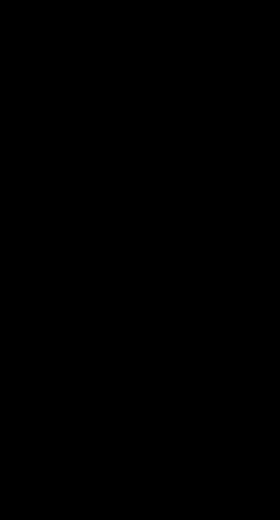

In [4]:
from IPython.display import Image, display
display(Image(filename="2D_young_double_slit.gif"))

# Two barriers

In [2]:
import xlb
import math
import time
import glob
import numpy as np
import jax
import jax.numpy as jnp
import imageio
from PIL import Image

from xlb.compute_backend import ComputeBackend
from xlb.precision_policy import PrecisionPolicy
from xlb.grid import grid_factory
from xlb.operator.stepper import IncompressibleNavierStokesStepper
from xlb.operator.boundary_condition import ExtrapolationOutflowBC, HalfwayBounceBackBC
from xlb.operator.equilibrium import QuadraticEquilibrium
from xlb.operator.macroscopic import Macroscopic
from xlb.utils import save_image

try:
    from xlb.utils import save_fields_vtk
    _HAS_VTK = True
except Exception:
    _HAS_VTK = False


# ------------------------------ Geometry helpers ------------------------------

def build_single_slit_barrier_indices(Nx, Ny, barrier_x, slit_width, slit_center_y=None):
    """
    Returns indices [xs, ys] for a vertical barrier at x=barrier_x, with ONE slit carved out.
    """
    if slit_center_y is None:
        slit_center_y = Ny // 2

    wall = np.zeros((Nx, Ny), dtype=np.uint8)
    wall[barrier_x, :] = 1

    s_y0 = max(1, slit_center_y - slit_width // 2)
    s_y1 = min(Ny - 2, slit_center_y + slit_width // 2)
    wall[barrier_x, s_y0:s_y1 + 1] = 0

    xs, ys = np.where(wall == 1)
    return [xs.astype(np.int32).tolist(), ys.astype(np.int32).tolist()]


def build_double_slit_barrier_indices(Nx, Ny, barrier_x, slit_width, slit_gap, slit_center_y=None):
    """
    Returns indices [xs, ys] for a vertical barrier at x=barrier_x, with TWO slits carved out.
    """
    if slit_center_y is None:
        slit_center_y = Ny // 2

    wall = np.zeros((Nx, Ny), dtype=np.uint8)
    wall[barrier_x, :] = 1

    c1 = slit_center_y - slit_gap // 2
    c2 = slit_center_y + slit_gap // 2

    s1_y0 = max(1, c1 - slit_width // 2)
    s1_y1 = min(Ny - 2, c1 + slit_width // 2)
    s2_y0 = max(1, c2 - slit_width // 2)
    s2_y1 = min(Ny - 2, c2 + slit_width // 2)

    wall[barrier_x, s1_y0:s1_y1 + 1] = 0
    wall[barrier_x, s2_y0:s2_y1 + 1] = 0

    xs, ys = np.where(wall == 1)
    return [xs.astype(np.int32).tolist(), ys.astype(np.int32).tolist()]


def indices_to_set_2d(indices):
    xs = np.asarray(indices[0], dtype=np.int32)
    ys = np.asarray(indices[1], dtype=np.int32)
    return set(zip(xs.tolist(), ys.tolist()))


def set_to_indices_2d(s):
    if not s:
        return [[], []]
    xs, ys = zip(*sorted(s))
    return [list(xs), list(ys)]


# ------------------------------ IO helpers ------------------------------

def make_gif(pattern="2D_young_wave_two_barriers_*.png", output="2D_young_two_barriers.gif", fps=20):
    files = sorted(glob.glob(pattern))
    if not files:
        raise RuntimeError(f"No PNG files found for pattern: {pattern}")
    frames = [Image.open(f).convert("RGB") for f in files]
    imageio.mimsave(output, frames, duration=1.0 / fps)
    print(f"GIF saved as {output}")


def to_01_fixed_scale(field2d, scale):
    a = np.asarray(field2d, dtype=np.float32)
    a = np.clip(a, -scale, +scale)
    return (a / scale + 1.0) * 0.5


# ------------------------------ Source injection ------------------------------

@jax.jit
def inject_source_equilibrium(f, xs, ys, feq):
    feq_q = jnp.reshape(feq, (feq.shape[0], -1))[:, 0]  # -> (q,)
    return f.at[:, xs, ys].set(feq_q[:, None])          # broadcast over Ns


def main():
    # -------------------- Domain (2D) --------------------
    Nx, Ny = 520, 280

    # -------------------- Barrier #1 (SINGLE slit) at Nx/2 --------------------
    barrier1_x = (2 * Nx) // 5
    slit1_width = 18
    slit1_center_y = Ny // 2

    # -------------------- Barrier #2 (DOUBLE slit) at 2Nx/5 --------------------
    barrier2_x = Nx // 2
    slit2_width = 18
    slit2_gap = 60
    slit2_center_y = Ny // 2

    # -------------------- Source (internal POINT source, no inlet) --------------------
    rho0 = 1.0
    rho_amp = 0.02
    freq = 0.02
    phase_per_step = 2.0 * math.pi * freq

    source_x = Nx // 8
    source_y = Ny // 2
    xs_src = np.array([source_x], dtype=np.int32)
    ys_src = np.array([source_y], dtype=np.int32)

    # -------------------- LBM parameters --------------------
    Re = 200.0
    L = float(Ny)
    u_char = 0.02
    nu = (u_char * L) / Re
    omega = 1.0 / (3.0 * nu + 0.5)

    # -------------------- Simulation control --------------------
    steps = 2500
    save_every = 10
    prefix = "2D_young_wave_two_barriers_"

    # -------------------- Backend & velocity set (JAX) --------------------
    compute_backend = ComputeBackend.JAX
    precision_policy = PrecisionPolicy.FP32FP32

    velocity_set = xlb.velocity_set.D2Q9(
        precision_policy=precision_policy,
        compute_backend=compute_backend,
    )

    xlb.init(
        velocity_set=velocity_set,
        default_backend=compute_backend,
        default_precision_policy=precision_policy,
    )

    grid = grid_factory((Nx, Ny), compute_backend=compute_backend)

    # -------------------- Boundary indices --------------------
    box_no_edge = grid.bounding_box_indices(remove_edges=True)
    left = box_no_edge["left"]
    right = box_no_edge["right"]
    top = box_no_edge["top"]
    bottom = box_no_edge["bottom"]

    # -------------------- Build each barrier separately --------------------
    barrier1 = build_single_slit_barrier_indices(
        Nx, Ny, barrier1_x, slit1_width, slit_center_y=slit1_center_y
    )
    barrier2 = build_double_slit_barrier_indices(
        Nx, Ny, barrier2_x, slit2_width, slit2_gap, slit_center_y=slit2_center_y
    )

    # -------------------- Remove overlaps with outer boundaries (separately) --------------------
    S_left = indices_to_set_2d(left)
    S_right = indices_to_set_2d(right)
    S_top = indices_to_set_2d(top)
    S_bottom = indices_to_set_2d(bottom)

    S_bar1 = indices_to_set_2d(barrier1)
    S_bar2 = indices_to_set_2d(barrier2)

    S_edges = S_left | S_right | S_top | S_bottom

    # Remove any barrier nodes on the edges
    S_bar1 = S_bar1 - S_edges
    S_bar2 = S_bar2 - S_edges

    # Also ensure boundaries do not contain barrier nodes (union of barriers)
    S_bar_all = S_bar1 | S_bar2
    S_left = S_left - S_bar_all
    S_right = S_right - S_bar_all
    S_top = S_top - S_bar_all
    S_bottom = S_bottom - S_bar_all

    left = set_to_indices_2d(S_left)
    right = set_to_indices_2d(S_right)
    top = set_to_indices_2d(S_top)
    bottom = set_to_indices_2d(S_bottom)

    barrier1 = set_to_indices_2d(S_bar1)
    barrier2 = set_to_indices_2d(S_bar2)

    # -------------------- Sanity check: source must not lie on BC or barriers --------------------
    src_pt = (int(source_x), int(source_y))
    if src_pt in (S_edges | S_bar_all):
        raise RuntimeError(
            f"Source point {src_pt} lies on a boundary or barrier cell. "
            "Move source_x/source_y or move barriers."
        )

    # -------------------- Boundary conditions --------------------
    # Outer boundaries (same type on all sides)
    bc_left = ExtrapolationOutflowBC(indices=left)
    bc_right = ExtrapolationOutflowBC(indices=right)
    bc_top = ExtrapolationOutflowBC(indices=top)
    bc_bottom = ExtrapolationOutflowBC(indices=bottom)

    # Barriers (separate BC objects, as you requested)
    bc_barrier1 = HalfwayBounceBackBC(indices=barrier1)  # single-slit wall at Nx/2
    bc_barrier2 = HalfwayBounceBackBC(indices=barrier2)  # double-slit wall at 2Nx/5

    boundary_conditions = [bc_barrier1, bc_barrier2, bc_left, bc_right, bc_top, bc_bottom]

    # -------------------- Stepper --------------------
    stepper = IncompressibleNavierStokesStepper(
        grid=grid,
        boundary_conditions=boundary_conditions,
        collision_type="BGK",
    )
    f_0, f_1, bc_mask, missing_mask = stepper.prepare_fields()

    # -------------------- Equilibrium operator for source injection --------------------
    eq = QuadraticEquilibrium(
        velocity_set=velocity_set,
        precision_policy=precision_policy,
        compute_backend=compute_backend,
    )

    # -------------------- Macroscopic --------------------
    macro = Macroscopic(
        compute_backend=ComputeBackend.JAX,
        precision_policy=precision_policy,
        velocity_set=velocity_set,
    )

    xs_src_j = jnp.array(xs_src)
    ys_src_j = jnp.array(ys_src)

    print("\n" + "=" * 100)
    print("XLB 2D | Young's wave two barriers (separate):")
    print(f"Barrier #1: SINGLE slit @ x = Nx/2 = {barrier1_x} | slit_width={slit1_width} | center_y={slit1_center_y}")
    print(f"Barrier #2: DOUBLE slit @ x = 2Nx/5 = {barrier2_x} | slit_width={slit2_width} | slit_gap={slit2_gap} | center_y={slit2_center_y}")
    print("Outer boundaries: ExtrapolationOutflow (same on all sides)")
    print("Barriers: HalfwayBounceBack (each as its own BC object)")
    print(f"Source: point @ ({source_x},{source_y}) | rho(t)=rho0+rho_amp*sin(2pi f t)")
    print(f"nu={nu:.6e} | omega={omega:.6f} | steps={steps} | save_every={save_every}")
    print("=" * 100 + "\n")

    t_wall = time.time()
    for t in range(steps):
        # --------- One LBM step ----------
        f_0, f_1 = stepper(f_0, f_1, bc_mask, missing_mask, omega, t)
        f_0, f_1 = f_1, f_0

        # --------- Source injection ----------
        rho_t = rho0 + rho_amp * math.sin(phase_per_step * t)
        feq_t = eq(
            jnp.array([rho_t], dtype=jnp.float32),
            jnp.array((0.0, 0.0), dtype=jnp.float32),
        )
        f_0 = inject_source_equilibrium(f_0, xs_src_j, ys_src_j, feq_t)

        # --------- Save visualization ----------
        if t % save_every == 0:
            rho, u = macro(f_0)
            rho2 = rho[0]

            rho_pert = np.array(rho2) - rho0
            img01 = to_01_fixed_scale(rho_pert, scale=3.0 * rho_amp)
            save_image(img01.T, timestep=t, prefix=prefix)

            if _HAS_VTK:
                vtk_prefix = f"2D_young_wave_two_barriers_"
                save_fields_vtk({"rho": rho2, "ux": u[0], "uy": u[1]}, timestep=t)

            dt_print = time.time() - t_wall
            print(
                f"step={t:6d} | rho_src={rho_t:+.5f} | rhoPert[min,max]=({rho_pert.min():+.3e},{rho_pert.max():+.3e})"
                f" | saved | walltime={dt_print:.2f}s"
            )
            t_wall = time.time()

    print("\nDone saving PNGs. Now making GIF...")
    make_gif(pattern=f"{prefix}_*.png", output="2D_young_two_barriers.gif", fps=20)


if __name__ == "__main__":
    main()

No GPU support is available; CPU fallback will be used.
registered bc ExtrapolationOutflowBC_112651366349 with id 6
registered bc ExtrapolationOutflowBC_112649782573 with id 7
registered bc ExtrapolationOutflowBC_112651396469 with id 8
registered bc ExtrapolationOutflowBC_112651396497 with id 9
registered bc HalfwayBounceBackBC_112651396493 with id 10
registered bc HalfwayBounceBackBC_112649558301 with id 11

XLB 2D | Young's wave two barriers (separate):
Barrier #1: SINGLE slit @ x = Nx/2 = 208 | slit_width=18 | center_y=140
Barrier #2: DOUBLE slit @ x = 2Nx/5 = 260 | slit_width=18 | slit_gap=60 | center_y=140
Outer boundaries: ExtrapolationOutflow (same on all sides)
Barriers: HalfwayBounceBack (each as its own BC object)
Source: point @ (65,140) | rho(t)=rho0+rho_amp*sin(2pi f t)
nu=2.800000e-02 | omega=1.712329 | steps=2500 | save_every=10

Saved .\fields_0000000.vtk in 0.031914 seconds.
step=     0 | rho_src=+1.00000 | rhoPert[min,max]=(+0.000e+00,+0.000e+00) | saved | walltime=0.

<Figure size 640x480 with 0 Axes>

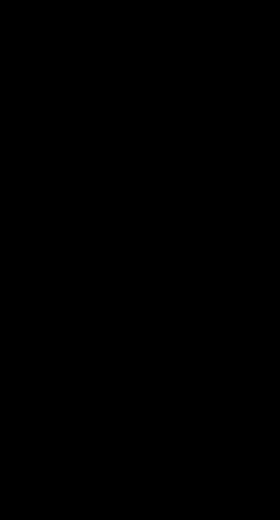

In [3]:
from IPython.display import Image, display
display(Image(filename="2D_young_two_barriers.gif"))